Single nuclei analysis of Decidua controls & PE: Performed by Olivia Debnath (Berlin Institute of Health). 

Background & technical notes: 

I). CellBender was used to correct for technical artifacts from the raw gene-barcode matrices (from Cellranger). Specifically, remove-background() was used to eliminate counts due to ambient RNA molecules and random barcode swapping. 

II). Data harmonization & cell-typing:
scVI/scANVI was used for data harmonization using "donor_id" as a batch key. Furthermore, we use two different kind of covariates to model the technical artifacts of the data that may likely influence downstream analysis:

1). Categorical covariates: time, gestational_week, library (since we've 10X v2 & v3 chemistry for library prep). 
2). Continuous covariates: n_genes_by_counts (genes having positive counts in a cell), total_counts(UMI), 
pct_counts_MT_genes & XIST-counts. This time, the cut-off for MT-genes were kept at 5%. 

scVI's variational autoencoder is then trained using the above batch key & covariates using 10 dimensions latent space & 2 layers for encoder and decoder NNs. The #epochs for training was determined automatically depending on the sample size. Zero-inflated negative binomial distribution (suitable for scRNA-seq analysis) was used for modelling gene likelihood. The latent variables were normally distributed & drop-out rate was kept at its default value. Note that, the scVI model was used as an pre-initialized model for further training scANVI for transferring cell annotations. 
 

Ground work on SP014 data (for learning cell annotations & internal verification): We made use of a "Logistic regression classifier" optimized by the stochastic gradient descent algorithm to build our custom model (by learning 'annotations' from SP014 decidua scRNA-seq data i.e., training dataset). The trained classifier was used to predict cell types/states in testing dataset. The classifier predict the identity of each query cell independently & as a second approach, refines annotations within local subclusters by over-clustering. The 'confidence of prediction' was evaluated. 

Pretrained scvi model using label keys (learnt from cell annotations of SP014 cohort & then analyzed using markers) were used as seed for transferring annotations (using scANVI). However, please note this is for preliminary annotation transfer. As an unsupervised approach, Leiden clustering was performed (initially at resolution=1/2) & then at higher resolutions. Clusters with robust/specific markers were kept separate & non-specifics were merged. The unsupervised (Leiden) vs supervised (LR predictions) were compared using confusion matrices. 

Biological note: 
1. The stromal/mesenchymal compartment were subclustered & validated using cell markers (may need further work). 

2. dMSC cluster is robust for MME & exhibits high IGF1 & SOX5 (indicate pre-stromal cells). It doesn't express NANOG/OCT4. Other markers like ZEB1/TWIST2 (see dotplots below) are important but not-specific for dMSC. It might be important to consider "psoitive" & "negative" markers for dMSC & use a module-scoring approach to better refine the cluster. 

3. dFB1 may be improved. DSC1/2 express high stromal markers such as PRL, IGFBP, LUM & RBP1- checked with subclusters (so, very likely they're DSC). 

3. dMAC1/2 transition is a temporary name given as it shows some plasticity and likely harbors both dMAC1 & dMAC2 phenotype (low CD163 & dMAC2 markers found). dMAC_sp is also a pet name & the cluster is kept separated as it has some own markers and appear mainly with the new samples. 

4. Certain clusters need more attention; few unique clusters with SP136 cohort- like DSC3 & dMAC2 based ones. DSC3 express some immune signatures like IFITM2, HLA-A/B, CCL21 along with stromal genes like IGFBP1, LUM & APOE. 

5. Ambiguous/spurious & contaminated clusters should be removed: 'C39_VCTs_remove', 'HBG1_C41', 'dFB_donor' for sure. 

6. Deported SCTs are found in the latest SP136 samples alongside SP014's 419-d. 
7. Presence of classical/non-classical monocytes (check analysis part). 

8. Ongoing work: Using Teichmann's "immune decidua dataset" (model) for predicting immune cell types in an automated way using LR classifier. May not be needed. 


III). DEG testing: 

Cell markers found using differential expression analysis (scVI) are ~comparable to our previous LR results. 

i).Bayes factor: Deep generative models for LFC (log-fold change) estimation & Bayesian statistics to explicitly control for effect-size via LFC (currently not performed by the state-the-art DE frameworks). Batch-correction performed while DEG inference (would be useful to try PE vs lateC using this approach). One can use multiple conditions to scan the top DEGs: lfc_mean >1, bayes_factor > 3 & non_zeros_proportion1 (cell type) > 0.2 (given FDR & delta cut-off are satisfied). 

ii).Wilcoxon rank sum test (implemented in scanpy): corrected for multiple testing. 
iii).Multivariate LR: to-do (after cell types are ~finalized) but not required. 

Further validation of subclusters: using topic modelling by Latent Dirichlet Allocation (LDA). 
[Not a part of this notebook]. 
LDA is a topic modelling method primarily used in the natural language processing field. By treating each cell as a document and each gene expression count as a word, one can use this method for single cell analysis. For the analysis, initially it's assumed that all cells have same label. The topic genes are sorted by descending order by Monte Carlo estimate of the topic proportions for each cell. By visualizing the topic proportions, it is usually found that the learned topics are generally dominant in cells bound to a close neighborhood on UMAP space. Sometimes, we find a topic is dominant in multiple clusters in the UMAP, which indicates similarilty between these clusters despite being far apart in the UMAP (possibly, because the local relationships aren't preserved beyond a certain threshold).

The following notebook was shared among collaborators (Dr.Florian Herse, Dr. Olivia Nonn & Daniela Valdes) for discussing the different stromal & immune cell subclusters. Note, that the annotations aren't fully finalized here & this serves as an exploratory analysis to investigate well-known markers.  

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
#Read the saved object:
#Now, h5 class can easily convert it to categoricals. 
dec_results= "/dh-projects/preeclampsia_2022/analysis/placenta_atlas_2022/decidua_anndata/SP014_SP136_decidua_analysis_010322.h5ad"

ldata_dec01= sc.read_h5ad(dec_results)
ldata_dec01

AnnData object with n_obs × n_vars = 69311 × 6000
    obs: 'donor_id', 'time', 'disease', 'tissue', 'smoking', 'cohort', 'library', 'procurement', 'placental_volume', 'gestational_weeks', 'gestational_days', 'maternal_BMI', 'maternal_age', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_MT_genes', 'log1p_total_counts_MT_genes', 'pct_counts_MT_genes', 'total_counts_Ribo_genes', 'log1p_total_counts_Ribo_genes', 'pct_counts_Ribo_genes', 'total_counts_HB_genes', 'log1p_total_counts_HB_genes', 'pct_counts_HB_genes', 'percent_mt2', 'n_counts', 'percent_Ribo2', 'percent_HB2', 'n_genes', 'XIST-counts', 'S_score', 'G2M_score', 'phase', 'celltypist_majority_voting', 'celltypist_predicted_labels', 'donor_id_reordered', 'seed_labels', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'majority_voting', 'predicted_labels', 'conf_score', 'over_clustering', 'leiden', '_scvi_raw_norm_scaling', 'leiden_res1.5', 'leiden_res2', 'dMSC_leiden', 'celltyp

In [3]:
ldata_dec01.obs['celltype_v2'].cat.categories

Index(['BTLA_lymphocyte', 'C39_VCTs_remove', 'DSC1', 'DSC2', 'DSC3',
       'HBG1_C41', 'VWA5A_C35', 'dEVT', 'dEpC', 'dFB1', 'dFB2', 'dFB_donor',
       'dGranul', 'dLEC', 'dMAC1', 'dMAC1/2 transition', 'dMAC1_sp', 'dMAC2',
       'dMSC', 'dMono_LYZ', 'dNK1', 'dNK2', 'dNK_prol', 'dPlasma_cell', 'dSMC',
       'dTcell', 'dVEC', 'deported_SCT'],
      dtype='object')

In [4]:
#Composition of the major clusters & few spurious/donor-specific cells:
ldata_dec01.obs['celltype_v2'].value_counts()

dTcell                10505
dMAC1                 10098
dNK1                   9682
dEpC                   7816
dLEC                   4608
dNK2                   3531
dMAC2                  3292
DSC3                   2911
dMAC1/2 transition     2897
dVEC                   2756
DSC1                   1716
dSMC                   1571
DSC2                   1163
dMAC1_sp               1119
deported_SCT           1065
dMono_LYZ               744
dMSC                    654
dPlasma_cell            551
dEVT                    522
dFB1                    416
dFB2                    407
dNK_prol                320
VWA5A_C35               276
dGranul                 263
BTLA_lymphocyte         128
C39_VCTs_remove         116
dFB_donor               101
HBG1_C41                 83
Name: celltype_v2, dtype: int64

In [5]:
sc.settings.set_figure_params(dpi=60)

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4,4)
plt.rcParams["axes.grid"] = False

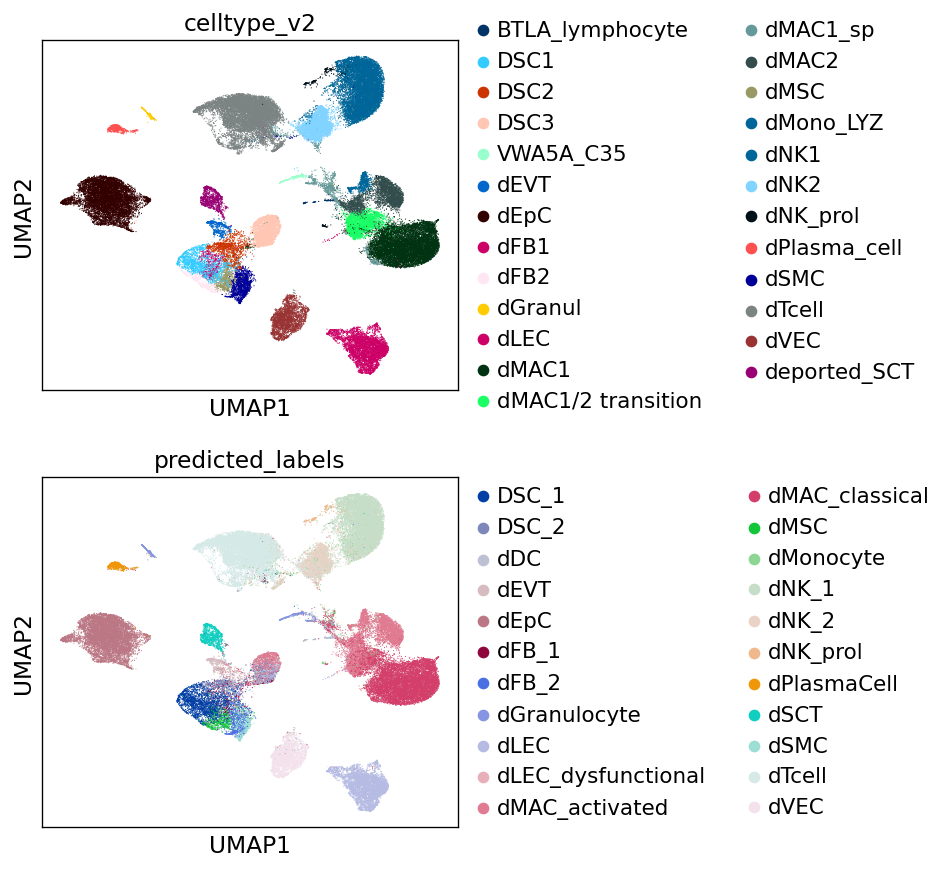

In [6]:
#Please see this:
#The label prediction is performed for own comparison using old data (Logistic Regression classifier used)

#Remove spurious clusters: 
sc.pl.umap(ldata_dec01[~ldata_dec01.obs['celltype_v2'].isin(['C39_VCTs_remove', 'HBG1_C41', 'dFB_donor'])], 
           color=['celltype_v2', 'predicted_labels'], ncols=1)

In [7]:
#Need suggestions about:
#1. dMAC1 vs dMAC2
#2. Separation of dMSC: Can it be a pre-DSC? [Doesn't express OCT4/NANOG but express MME/IGF1]. dMSC is finalized! 

In [8]:
#Separate by time: to evaluate the comparative clusterings & harmonization. 
#'C39_VCTs_remove', 'HBG1_C41', 'dFB_donor' need to be removed as they are contamination/donor specific sparse cells.
#Lines commented out as notebook exceeding 25 MB. 

# for i in ldata_dec01.obs['time'].cat.categories:
#     print(i) 
#     fig= sc.pl.umap(ldata_dec01[ldata_dec01.obs['time'] == i], color = 'celltype_v2', return_fig=True, title= i)
#     #pdf.savefig(fig)

In [9]:
# #Look at Controls vs PE: 
# #'C39_VCTs_remove', 'HBG1_C41', 'dFB_donor' need to be removed as they are contamination/donor specific sparse cells.
# for i in ldata_dec01.obs['disease'].cat.categories:
#     print(i) 
#     fig= sc.pl.umap(ldata_dec01[ldata_dec01.obs['disease'] == i], color = 'celltype_v2', return_fig=True, title= i)
#     #pdf.savefig(fig)

In [10]:
# #10X v3 has a significantly higher QC (#UMI & #genes):
# #Contributed to few extra clusters- need to evaluate the differences cautiously:
# for i in ldata_dec01.obs['library'].cat.categories:
#     print(i) 
#     fig= sc.pl.umap(ldata_dec01[ldata_dec01.obs['library'] == i], color = 'celltype_v2', return_fig=True, title= i)
#     #pdf.savefig(fig)

In [10]:
# #Segregate by donor_id:
# #Final annotations would be refined later:
# for i in ldata_dec01.obs['donor_id_reordered'].cat.categories:
#     print(i) 
#     fig= sc.pl.umap(ldata_dec01[ldata_dec01.obs['donor_id_reordered'] == i], color = 'celltype_v2', 
#                     return_fig=True, title= i, legend_loc={})
#     #pdf.savefig(fig)

In [11]:
#Subset the stromal subclusters for analysis:
#DSC3 were excluded from the final analysis (just found by 10X V3 plus, had ambiguous markers)
ldata_stromal= ldata_dec01[ldata_dec01.obs['celltype_v2'].isin(['DSC1', 'DSC2', 'DSC3', 'dFB1',
'dFB2', 'dSMC', 'dMSC'])]

ldata_stromal.obs['celltype_v2'].value_counts()

DSC3    2911
DSC1    1716
dSMC    1571
DSC2    1163
dMSC     654
dFB1     416
dFB2     407
Name: celltype_v2, dtype: int64

         Falling back to preprocessing with `sc.pp.pca` and default params.


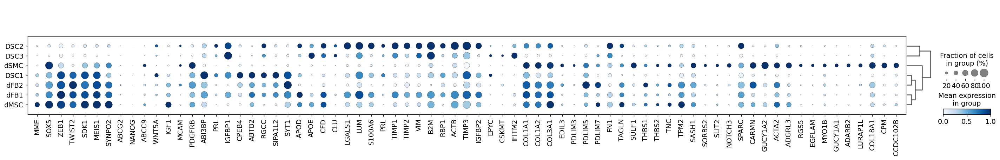

In [12]:
#Plot important genes for dMSC, stromal & FB lineages:
#Acquired from old & current markers (major ones were tallied with literature- such as https://www.nature.com/articles/s41586-018-0698-6). 
#Cell markers showed overlap with pseudotime genes (leaf) previously calculated.

stromal_genes= ['MME', 'SOX5', 'ZEB1', 'TWIST2', 'SDK1', 'MEIS1', 'SYNPO2', 'ABCG2', 'NANOG',
               'ABCC9', 'WNT5A', 'IGF1', 'MCAM', 'PDGFRB','ABI3BP', 'PRL', 'IGFBP1', 'CPEB4', 'ABTB2', 'RGCC', 'SIPA1L2', 'SYT1',
               'APOD', 'APOE', 'CFD', 'CLU', 'LGALS1', 'LUM', 'S100A6', 'PRL', 'TIMP1', 'TIMP2', 'VIM', 
                'B2M', 'RBP1', 'ACTB', 'TIMP3', 'IGFBP2', 'EPYC','CSKMT', 'IFITM2','COL1A1', 'COL1A2', 'COL3A1', 
                'EDIL3', 'PDLIM3', 'PDLIM5', 'PDLIM7', 'FN1', 'TAGLN', 'SULF1', 'THBS1', 'THBS2', 'TNC', 'TPM2', 
                'SASH1', 'SORBS2', 'SLIT2', 'NOTCH3', 'SPARC', 'CARMN', 'GUCY1A2', 'ACTA2', 'ADGRL3', 'RGS5','EGFLAM', 'MYO1B', 'GUCY1A1', 
                'ADARB2', 'LURAP1L', 'COL18A1', 'CPM', 'CCDC102B']

#Basic dot-plot: 
sc.tl.dendrogram(ldata_stromal, groupby= 'celltype_v2') 
              
sc.pl.dotplot(ldata_stromal, stromal_genes, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var") 

#Point out marker list of DSC3: signals IFITM2, CSKMT & other inflammatory genes. Do they associate with macrophages?
#DSC3 majorly found with new samples. 

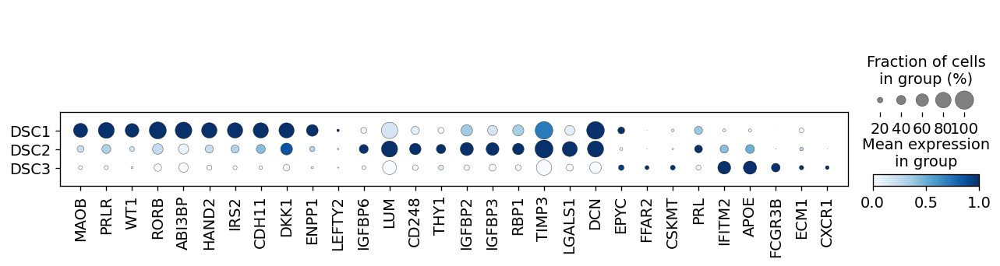

In [13]:
#Plot only DSC1, DSC2 & DSC3 genes from the markers from Naive Bayes DEG analysis (runs on covariate corrected VAE model in scVI)
stromal2_genes= ['MAOB', 'PRLR', 'WT1', 'RORB', 'ABI3BP', 'HAND2', 'IRS2', 'CDH11', 'DKK1', 'ENPP1', 'LEFTY2', 
                'IGFBP6', 'LUM', 'CD248', 'THY1', 'IGFBP2', 'IGFBP3', 'RBP1', 'TIMP3', 'LGALS1', 'DCN',
                'EPYC', 'FFAR2', 'CSKMT', 'PRL', 'IFITM2', 'APOE', 'FCGR3B', 'ECM1', 'CXCR1']


#DSC1 & DSC2 hold pretty distinct markers w.r.t robustness & specificity. 
sc.pl.dotplot(ldata_dec01[ldata_dec01.obs['celltype_v2'].isin(['DSC1', 'DSC2', 'DSC3'])], 
              stromal2_genes, groupby= 'celltype_v2', 
    color_map="Blues", use_raw=True, standard_scale="var") 

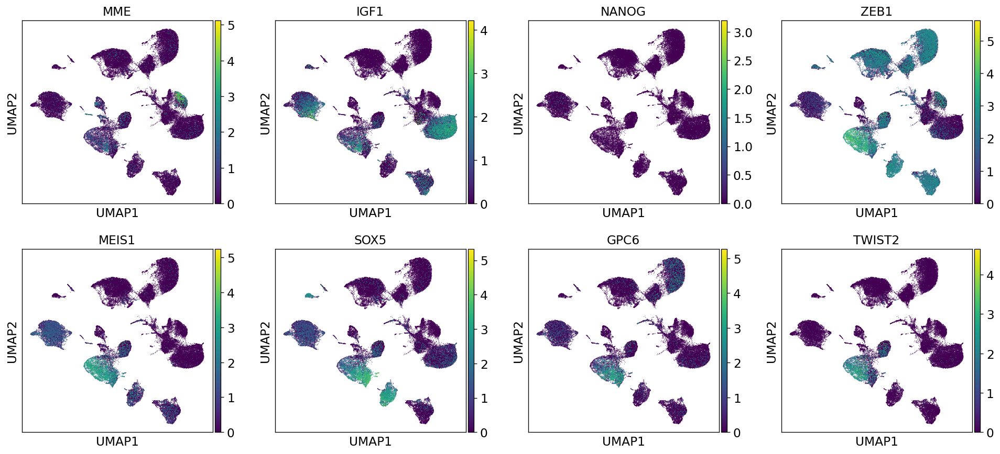

In [14]:
#Plot dMSC markers: 
#Can positive/negative markers be used for single nuclei data? Otherwise, MME & IGF1 look appropriate. 
sc.pl.umap(ldata_dec01, color=['MME', 'IGF1', 'NANOG', 'ZEB1', 'MEIS1', 'SOX5', 'GPC6', 'TWIST2'])

In [15]:
# sc.settings.set_figure_params(dpi=60)

# #C38: XCR1, WDFY4, BTLA, SUB1, ZNF366. 
# #Currently annotated as "BTLA_lymphocyte": is it dDC from our previous version?! 
# sc.pl.umap(ldata_dec01, color= ['XCR1', 'WDFY4', 'BTLA', 'SUB1', 'ZNF366', 'LGALS2', 'DNASE1L3',
#                              'ASB2', 'NEGR1'], ncols=3)

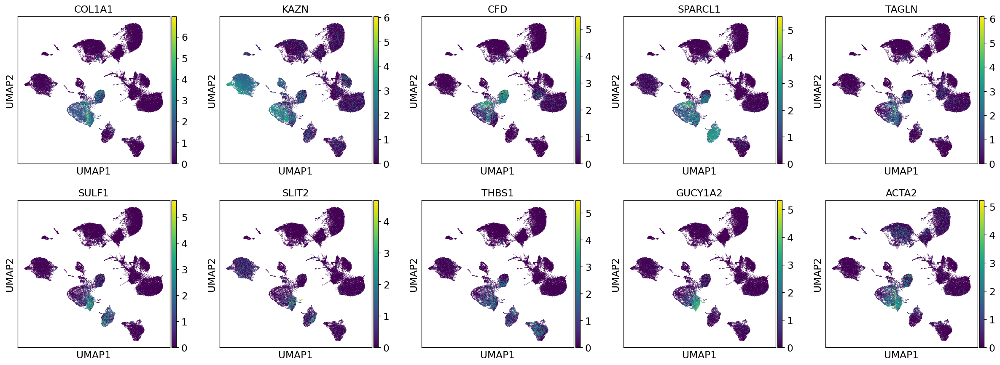

In [17]:
#FB & dSMC markers: 
#Presumably, dFB2 & dSMC are quite plastic and the former can differentiate to dSMC. 
#sc.pl.umap(ldata_dec01, color= ['COL1A1', 'COL1A2', 'COL3A1', 'IGFBP2', 'JUND', 'APOE', 'APOD', 'KAZN', 'CFD', 'SPARCL1',
                             #'COL6A2', 'TAGLN', 'SULF1', 'SLIT2', 'THBS1', 'THBS2', 'SORBS2', 'GUCY1A2', 'ACTA2'], ncols=5)

sc.pl.umap(ldata_dec01, color= ['COL1A1', 'KAZN', 'CFD', 'SPARCL1',
                             'TAGLN', 'SULF1', 'SLIT2', 'THBS1', 'GUCY1A2', 'ACTA2'], ncols=5)

#Can DSC3 be a subset of fibroblast?! 

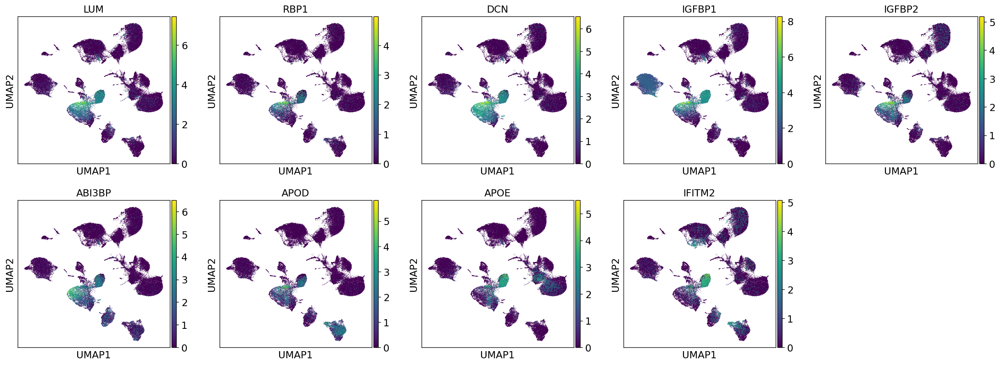

In [18]:
#Plot few important stromal genes: 
sc.pl.umap(ldata_dec01, color= ['LUM', 'RBP1', 'DCN', 'IGFBP1', 'IGFBP2', 'ABI3BP',
                               'APOD', 'APOE', 'IFITM2'], ncols=5)

#DSC3 express stromal markers such as IGFBP, PRL & LUM along with APOD/APOE & some immune markers.
#Seems like DSC2 can lead to DSC3 (but more evidences required)

In [19]:
#Subset dMAC groups: 
ldata_mac= ldata_dec01[ldata_dec01.obs['celltype_v2'].isin(['dMAC1', 'dMAC2', 'dMAC1_sp', 'dMAC1/2 transition',
                                                           'dMono_LYZ', 'BTLA_lymphocyte'])]

ldata_mac.obs['celltype_v2'].value_counts() #preliminary annotation only.

#MAC1/2 transition is a pet name since this cluster seems to have both MAC states (see, 'predicted_labels' umap)

dMAC1                 10098
dMAC2                  3292
dMAC1/2 transition     2897
dMAC1_sp               1119
dMono_LYZ               744
BTLA_lymphocyte         128
Name: celltype_v2, dtype: int64

         Falling back to preprocessing with `sc.pp.pca` and default params.


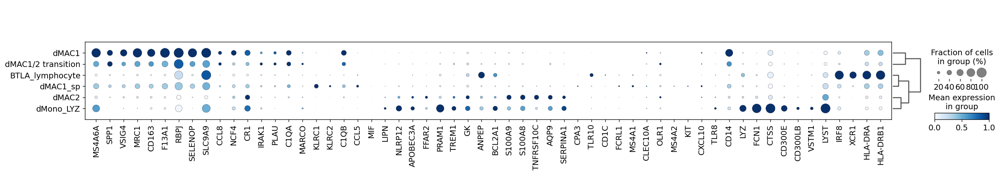

In [20]:
#Major focus: macrophages:
mac_markers= ['MS4A6A', 'SPP1', 'VSIG4', 'MRC1', 'CD163', 
              'F13A1', 'RBPJ', 'SELENOP', 'SLC9A9', 'CCL8', 'NCF4', 'CR1', 'IRAK1', 'PLAU', 'C1QA',
             'MARCO', 'KLRC1', 'KLRC2', 'C1QB', 'CCL5', 'MIF', 'LIPN', 'NLRP12','APOBEC3A', 'FFAR2', 'PRAM1',
             'TREM1', 'GK', 'ANPEP', 'BCL2A1', 'S100A9', 'S100A8', 'TNFRSF10C', 'AQP9', 'SERPINA1',
              'CPA3', 'TLR10', 'CD1C', 'FCRL1', 'MS4A1', 'CLEC10A', 'OLR1', 'MS4A2', 'KIT', 'CXCL10', 'TLR8', 
             'CD14', 'LYZ', 'FCN1', 'CTSS', 'CD300E', 'CD300LB', 'VSTM1', 'LYST', 'IRF8', 'XCR1',
             'HLA-DRA', 'HLA-DRB1']


sc.tl.dendrogram(ldata_mac, groupby= 'celltype_v2') 
              
sc.pl.dotplot(ldata_mac, mac_markers, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var") 

#So, BTLA_lymphocyte will be our "dDC." dMAC1_sp is kept separate as it's not robust for DC markers. 
#Suggestions required for "dMAC1_sp"

#How should we name MAC1/2 transition: the CD163-low part should be ~MAC1 & the cells with nil expression is ~MAC2?! 

In [38]:
#sc.pl.dotplot(ldata_mac, mac_markers, groupby= 'celltype_v2', dendrogram=True,
    #color_map="Blues")

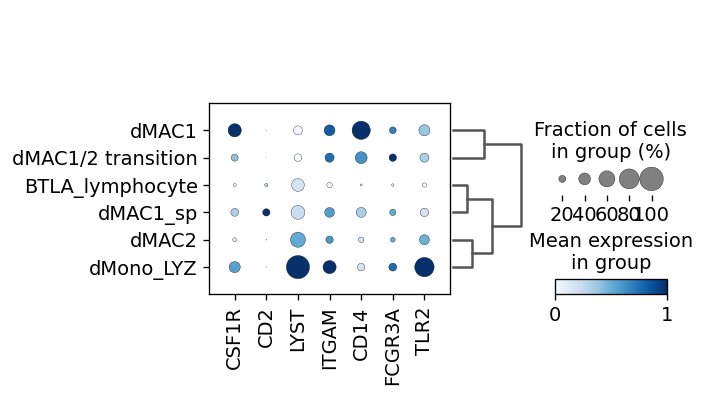

In [21]:
#CD11b= ITGAM.; CD16= FCGR3A; 
sc.pl.dotplot(ldata_mac, ['CSF1R', 'CD2', 'LYST', 'ITGAM', 'CD14', 'FCGR3A', 'TLR2'],
              groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var") 

#dMono_LYZ= dMono1; dMAC1/2 transition= dMono2 (after finalizing annotations)

In [22]:
#Subset NKC subsets:
ldata_nkc= ldata_dec01[ldata_dec01.obs['celltype_v2'].isin(['dNK1', 'dNK2', 'dNK_prol', 'dTcell'])]
ldata_nkc.obs['celltype_v2'].value_counts() 

dTcell      10505
dNK1         9682
dNK2         3531
dNK_prol      320
Name: celltype_v2, dtype: int64

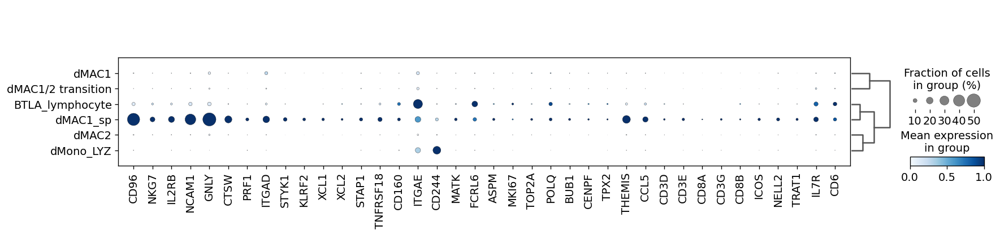

In [23]:
#Selected NK & T-cell markers. Traditional "NKT" express markers from both groups: 
nkt_markers= ['CD96', 'NKG7', 'IL2RB', 'NCAM1', 'GNLY', 'CTSW', 'PRF1', 
              'ITGAD', 'STYK1', 'KLRF2', 'XCL1', 'XCL2', 'STAP1', 'TNFRSF18', 'CD160', 'ITGAE', 
              'CD244', 'MATK', 'FCRL6', 'ASPM', 'MKI67', 'TOP2A', 'POLQ', 'BUB1', 'CENPF', 'TPX2', 
              'THEMIS', 'CCL5', 'CD3D', 'CD3E', 'CD8A', 'CD3G', 'CD8B', 'ICOS', 'NELL2', 'TRAT1',
             'IL7R', 'CD6']

#dMAC1_sp is more ~NKC in nature but also, express myeloid genes. 
sc.pl.dotplot(ldata_mac, nkt_markers, 
              groupby= 'celltype_v2', dendrogram=True, color_map="Blues", use_raw=True, standard_scale="var") 


         Falling back to preprocessing with `sc.pp.pca` and default params.


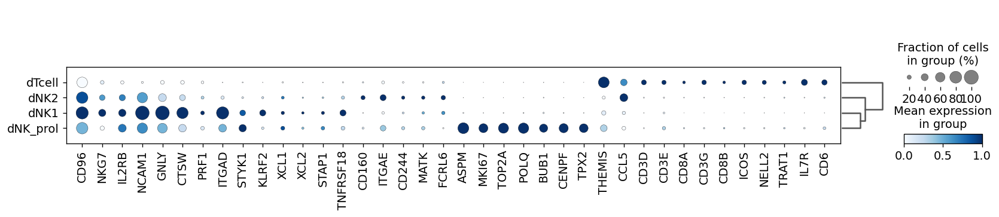

In [24]:
#NKC markers: 
sc.tl.dendrogram(ldata_nkc, groupby= 'celltype_v2') 
              
sc.pl.dotplot(ldata_nkc, nkt_markers, 
              groupby= 'celltype_v2', dendrogram=True, color_map="Blues", use_raw=True, standard_scale="var") 

Insights from a Neurology scRNA-seq project:
    
Reference Cell paper: https://www.cell.com/immunity/pdf/S1074-7613(18)30424-2.pdf

This paper speaks of a module "hNK1_sp" that is enriched for CD56 dim NK cells. I think I should plot the genes in hNK1_sp & hNK2_sp. On an important note, there is often a continuum of cells between CD56 bright & CD56 low- for which I suggested calling it CD56 positive. For instance, XCL1/XCL2 is also upregulated in NK1- genes encoding chemoattractants that recruit dendritic cells. Another paper on this: https://cancerimmunolres.aacrjournals.org/content/7/7/1162 I'm not totally sure if XCL genes belong to CD56 bright or low.

hNK_Sp2: cells expressed genes encoding the secreted molecules GZMK, XCL1, XCL2, LIF, and GM-CSF (CSF2) and the transcription factors IRF8, GATA3, FOSB, and NFKB1 more strongly than the other subsets.

In [25]:
#sc.settings.set_figure_params(dpi=60)

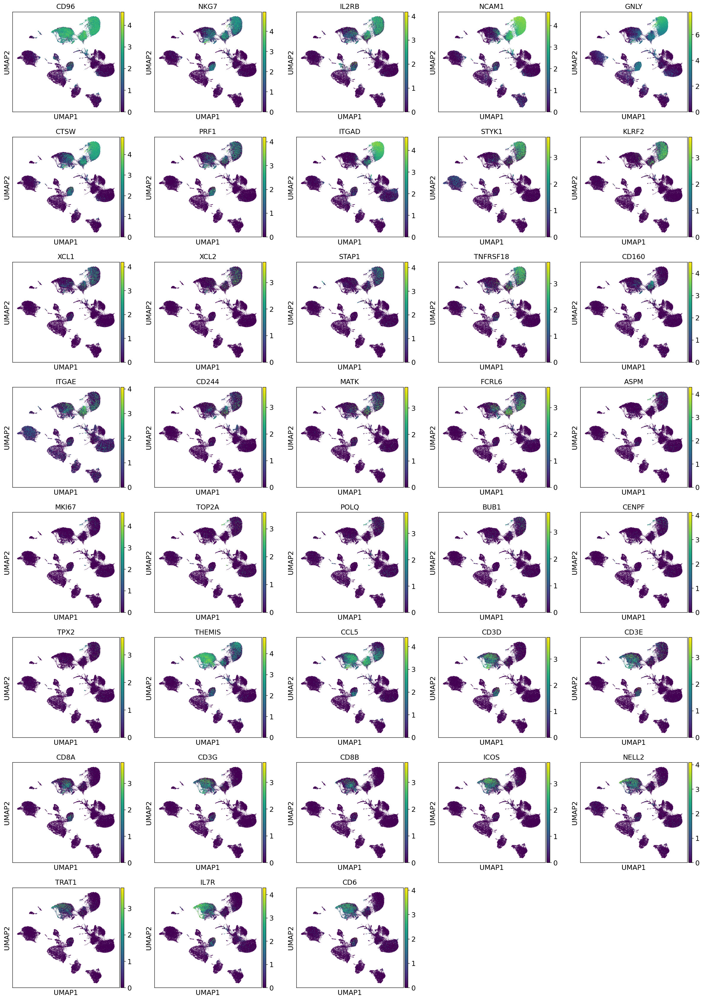

In [26]:
#Plot the Natural killer & T-cells cells on the embedding:

sc.pl.umap(ldata_dec01, color= ['CD96', 'NKG7', 'IL2RB', 'NCAM1', 'GNLY', 'CTSW', 'PRF1', 
              'ITGAD', 'STYK1', 'KLRF2', 'XCL1', 'XCL2', 'STAP1', 'TNFRSF18', 'CD160', 'ITGAE', 
              'CD244', 'MATK', 'FCRL6', 'ASPM', 'MKI67', 'TOP2A', 'POLQ', 'BUB1', 'CENPF', 'TPX2', 
              'THEMIS', 'CCL5', 'CD3D', 'CD3E', 'CD8A', 'CD3G', 'CD8B', 'ICOS', 'NELL2', 'TRAT1',
             'IL7R', 'CD6'], ncols=5)

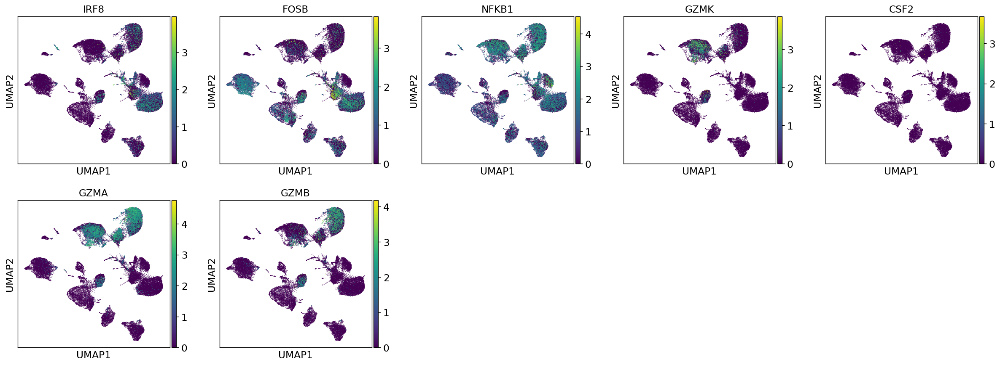

In [27]:
sc.pl.umap(ldata_dec01, color= ['IRF8', 'FOSB', 'NFKB1', 'GZMK', 'CSF2', 'GZMA', 'GZMB'], ncols=5)

In [28]:
#More insights from NKC subsets:
#CD56 bright: RGS1 & CD160 driving hNK_sp2 
cd56_bright= ['XCL1', 'XCL2', 'KLRD1', 'KLRF2', 'GZMK', 'LIF', 'RGS1', 'CD160', 'KLRB1', 'SPRY2', 'COTL1', 'HSP90AB1',
             'CSF2', 'IL32', 'ADGRG3', 'IL2RB', 'GATA3', 'FOSB', 'IRF8', 'FOSB', 'ID1', 'EGR1', 'NFKB1', 'TOX2']

cd56_dim= ['FGFBP2', 'GZMB', 'CST7', 'SPON2', 'GNLY', 'PRF1', 'LAIR2', 'IGFBP7', 'PTGDS', 'CCL4', 'S100A4', 'CYBA', 'CD99',
          'ANXA1', 'S100A6', 'CD247', 'ITGB2', 'SYNE2', 'GNG2', 'ARL4C', 'DDIT3', 'HOPX', 'CREM', 'BHLHE40', 'ARL4C']


hNK_sp3= ['IL7R', 'DUSP4', 'CD52', 'SELL', 'CD44', 'CAPG', 'LTB', 'HLA-DRB1', 'YBX3', 'GZMK', 'TCF7', 'GATA3', 'CXCR3', 
          'HLA-DRA', 'HLA-DRB5', 'KLRC2']

hNK_sp4= ['TXNIP', 'TTC30B', 'LINC01011', 'ARRDC3', 'GIMAP7', 'SDF2', 'INPP5F', 'API5', 'JUN', 'EOMES', 'ZNF397', 'CNOT8', 'CX3CR1']

#Calculate the module scores:
sc.tl.score_genes(ldata_dec01, gene_list= cd56_dim, score_name= "CD56Dim_hNK_sp1")
sc.tl.score_genes(ldata_dec01, gene_list= cd56_bright, score_name= "CD56Bright_hNK_sp2")
sc.tl.score_genes(ldata_dec01, gene_list= hNK_sp3, score_name= "hNK_sp3")
sc.tl.score_genes(ldata_dec01, gene_list= hNK_sp4, score_name= "hNK_sp4")

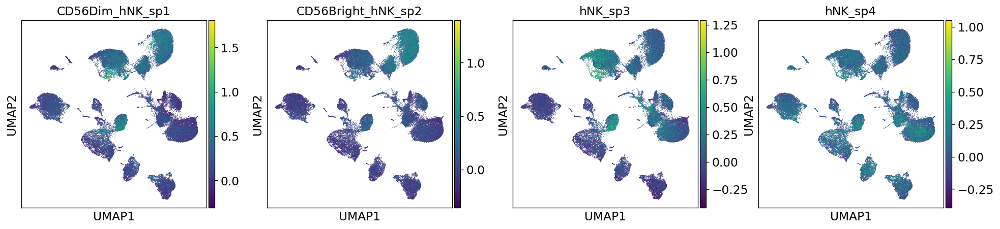

In [29]:
#Plot the different modules to understand the phenotype of dNK1 & dNK2:
sc.pl.umap(ldata_dec01, color= ['CD56Dim_hNK_sp1', 'CD56Bright_hNK_sp2', 'hNK_sp3', 'hNK_sp4'])

#No strong differences stem from CD56 bright & dim. Analysis wasn't conclusive. 

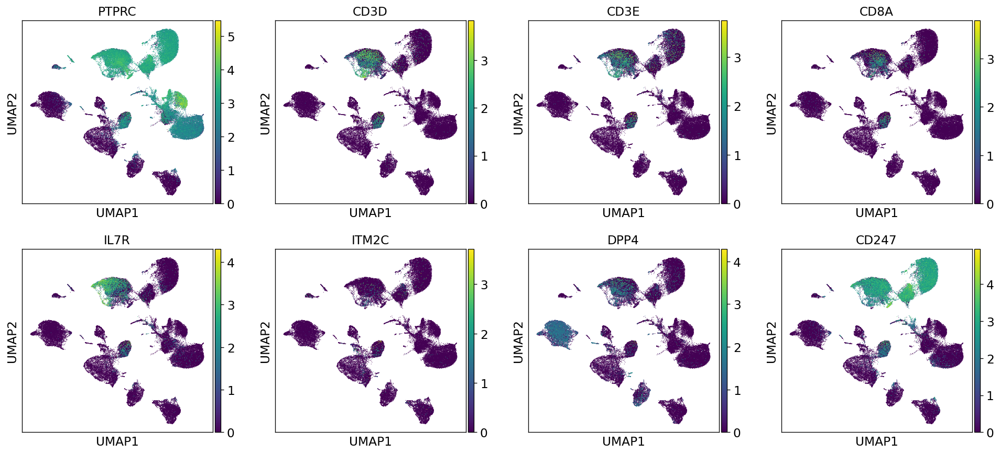

In [30]:
#Does the presence of CD8A with IL7R & DPP4 suggest tissue-resident T-cells? Not investigated in the current manuscript. 
sc.pl.umap(ldata_dec01, color= ['PTPRC', 'CD3D', 'CD3E', 'CD8A', 'IL7R', 'ITM2C', 'DPP4', 'CD247'])

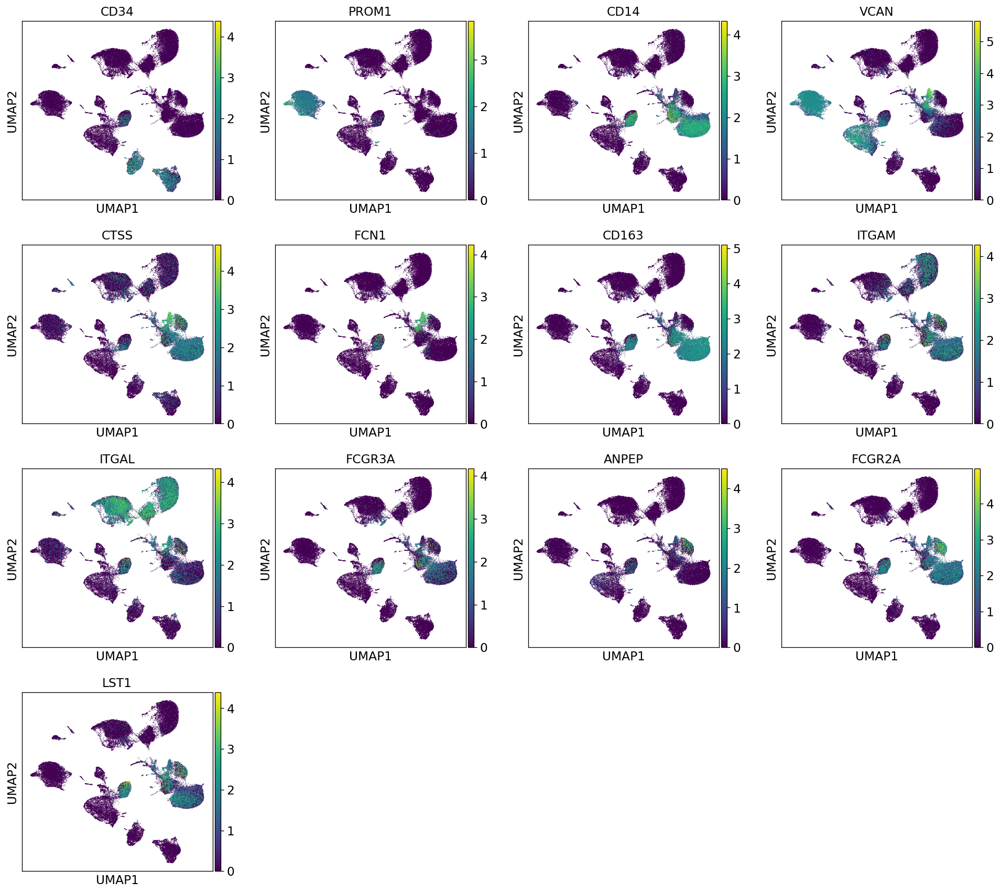

In [31]:
#Most likely, we have "Classical Monocytes":
#SMA: CD34-, CD133-, CD33+, CD11a+ (ITGAL), CD11b+ (ITGAM), CD14+, CD16- (FCGR3A), CD13+ (ANPEP), CD61+, CD49e+, CD32+ (FCGR2A).
#mRNA: CD14, VCAN, CTSS, FCN1, CD163. 

#Non-Classical Monocytes:
#SMA: CD34-, CD133-, CD33+, CD11a hi, CD11b-, CD14-, CD16+, CD13+, CD61-, CD49e dim, CD32+, CD127+ (IL7R). 
#mRNA: FCGR3A, LST1, MS4A7, SAT1

#Use literature based monocyte markers (classical & non-classical):
sc.pl.umap(ldata_dec01, color= ['CD34', 'PROM1', 'CD14', 'VCAN', 'CTSS', 'FCN1', 'CD163', 
                     'ITGAM', 'ITGAL', 'FCGR3A', 'ANPEP', 'FCGR2A', 'LST1'])

#dMAC1/2 transition: shows up CD14, CD163, ITGAM & FCGR3A. Since DSC3 shows strong MAC/Mono markers alongside stromal/EVT- it can be likely contaminated. 

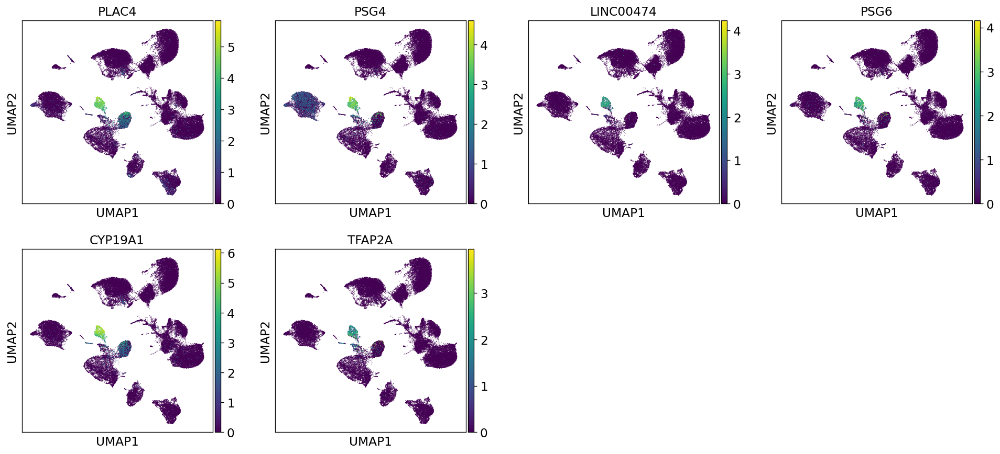

In [32]:
#Deported STB markers: 
#Present in 419d sample (SP014) & the new (SP136) samples 
sc.pl.umap(ldata_dec01, color= ['PLAC4', 'PSG4', 'LINC00474', 'PSG6', 'CYP19A1', 'TFAP2A'])


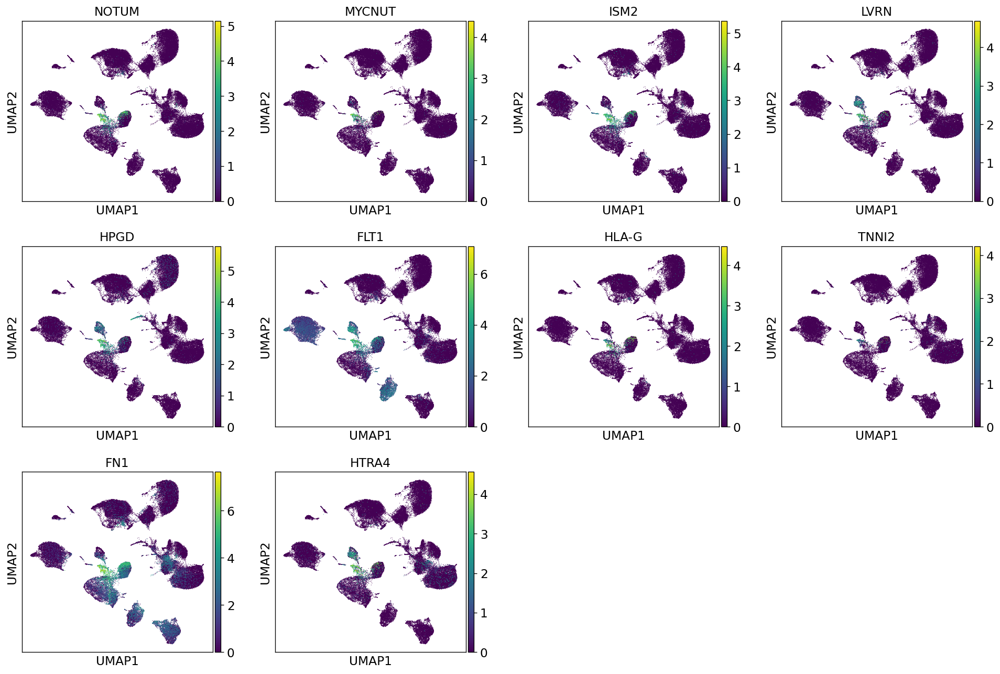

In [33]:
#dEVT markers: 
#A part of DSC3 is contaminated with EVT markers such as ISM2 & FLT1. 
sc.pl.umap(ldata_dec01, color= ['NOTUM', 'MYCNUT', 'ISM2', 'LVRN', 'HPGD', 'FLT1',
                               'HLA-G', 'TNNI2', 'FN1', 'HTRA4'])

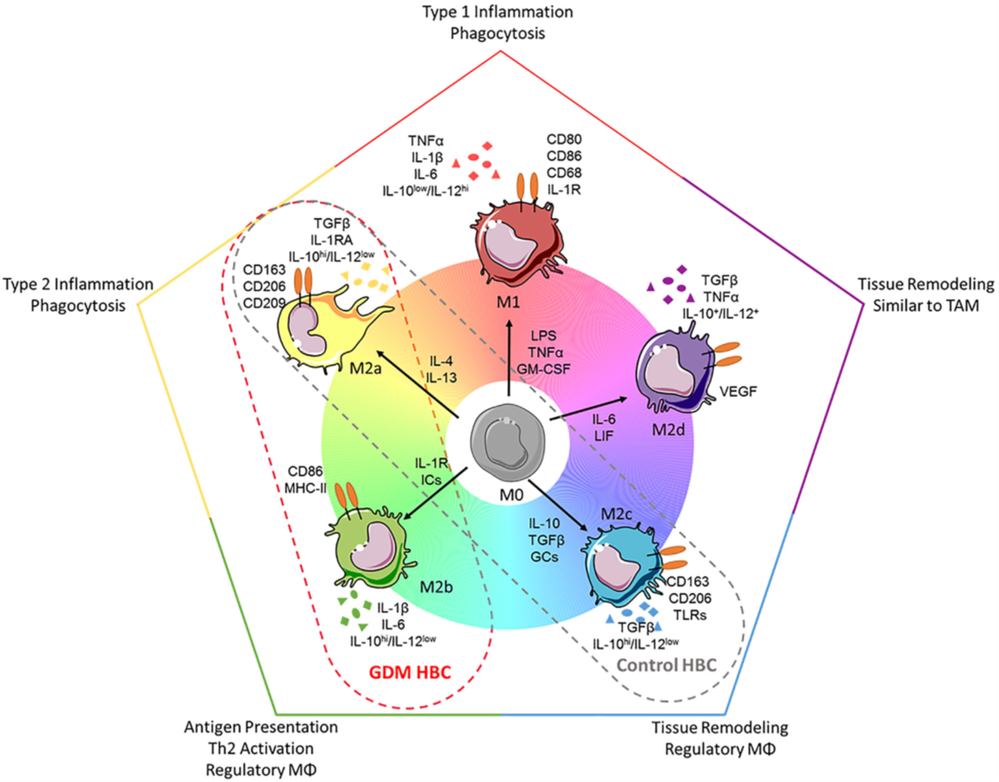

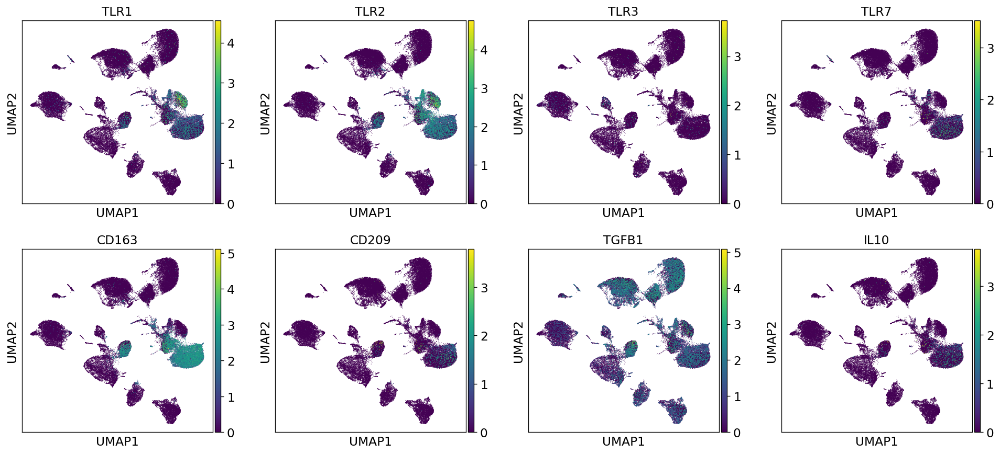

In [39]:
#Tissue remodelling MAC:
sc.pl.umap(ldata_dec01, color=['TLR1', 'TLR2', 'TLR3', 'TLR7', 'CD163', 'CD209', 'TGFB1', 'IL10'])

#DSC3 express robust MAC markers such as CD163 & even, TLR2. Can a stromal cell express TLR?! 

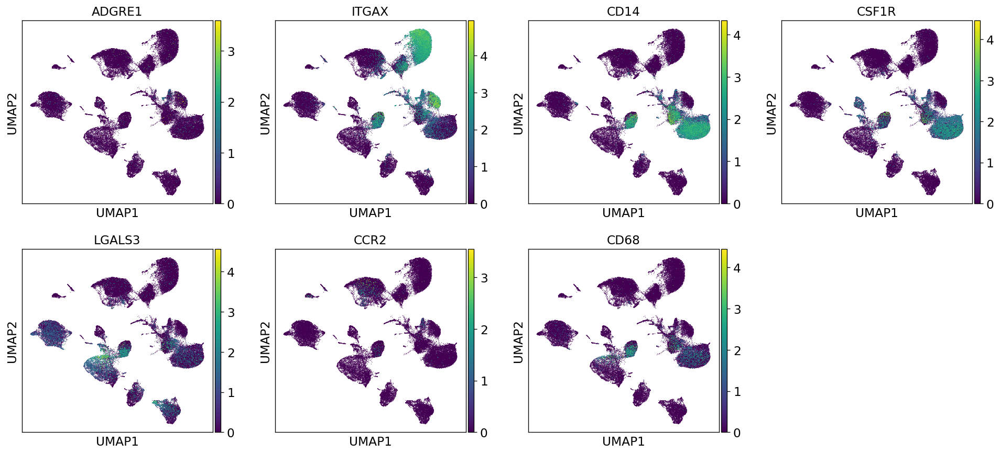

In [40]:
#Canonical myeloid expression:
sc.pl.umap(ldata_dec01, color=['ADGRE1', 'ITGAX', 'CD14', 'CSF1R', 'LGALS3', 'CCR2', 'CD68'])

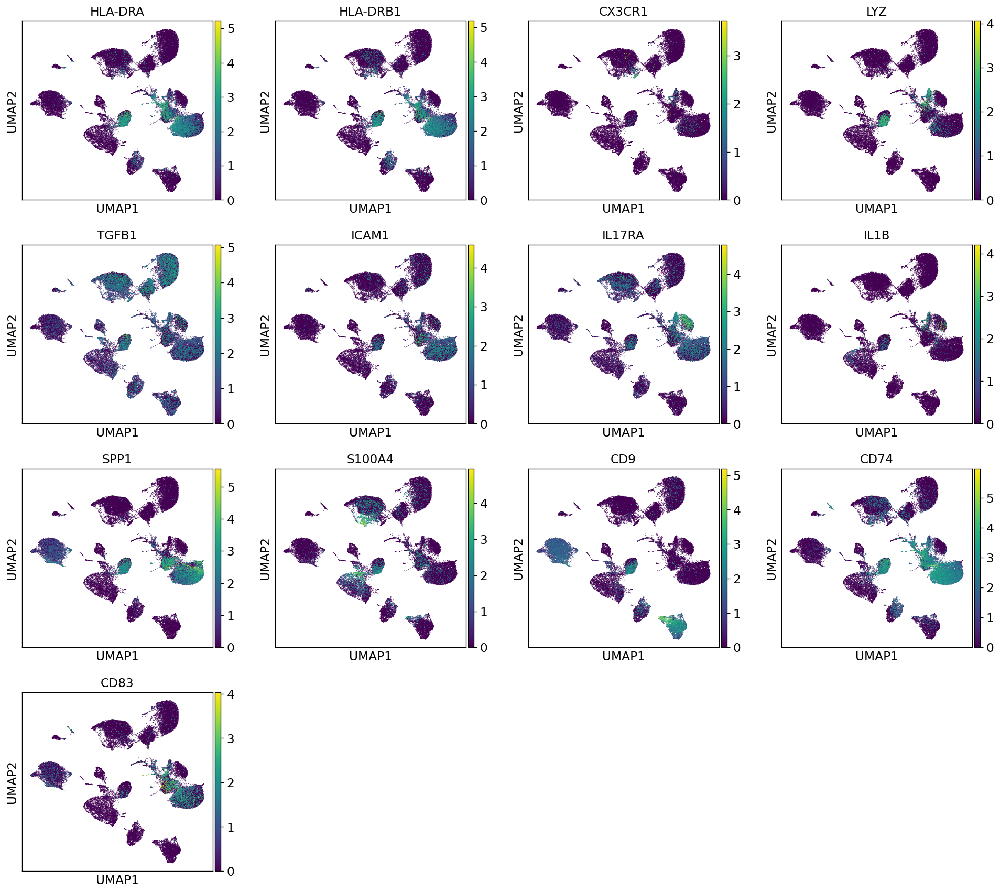

In [41]:
#Antigen-presenting inflammatory HC:
sc.pl.umap(ldata_dec01, color=['HLA-DRA', 'HLA-DRB1', 'CX3CR1', 'LYZ', 'TGFB1', 'ICAM1', 'IL17RA', 'IL1B',
                            'SPP1', 'S100A4', 'CD9', 'CD74', 'CD83'])

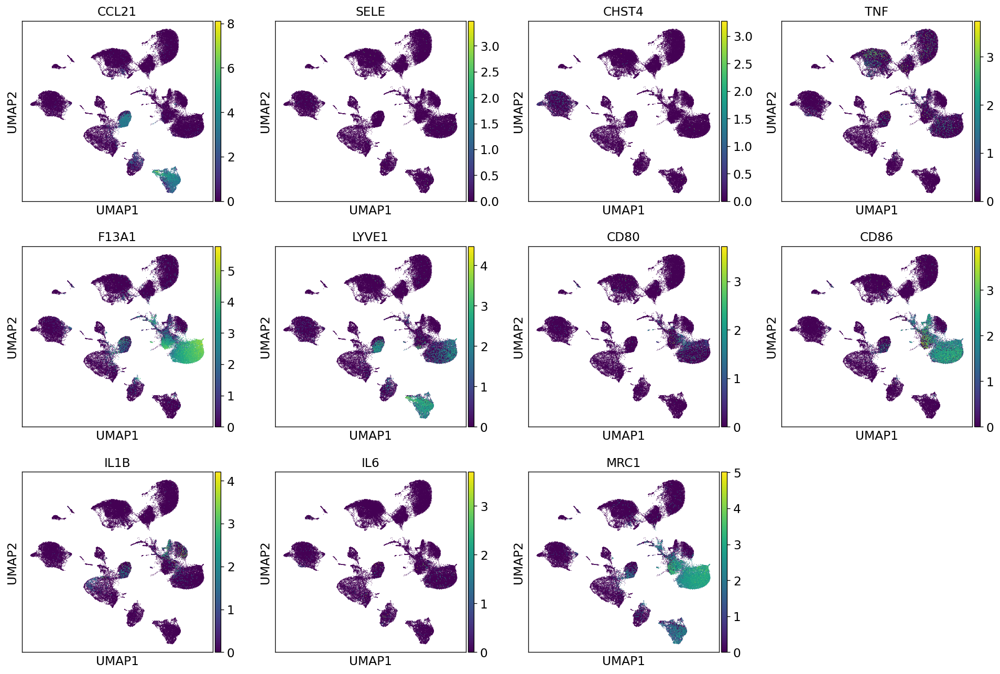

In [43]:
#Plot dMAC markers: 
#Resident macrophages: F13A1/LYVE1. 

#dMAC1: LYVE1 is a marker for high endothelial venules: 10.1093/humrep/deaa234 (markers CCL21, SELE, CHST4, ANXA2, to exclude this). 
sc.pl.umap(ldata_dec01, color=['CCL21', 'SELE', 'CHST4', 'TNF', 'F13A1', 'LYVE1', 
                            'CD80', 'CD86', 'IL1B', 'IL6', 'MRC1'])

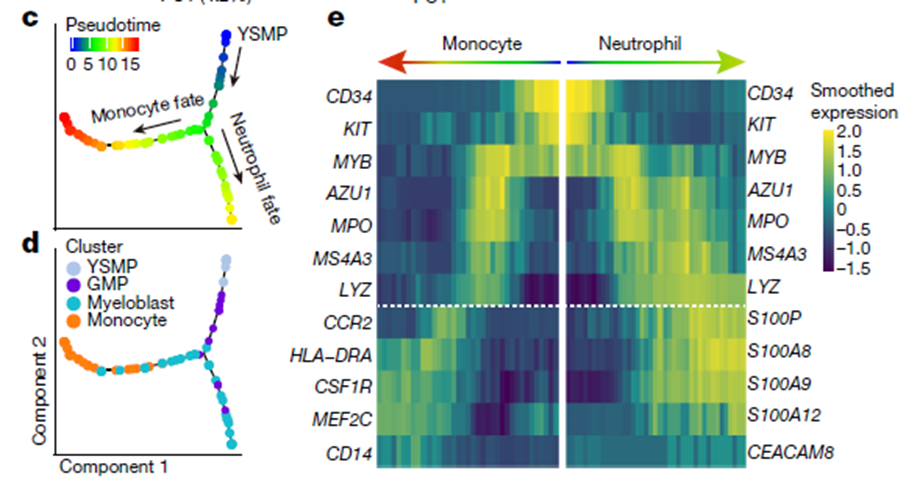

In [44]:
#Plot ON's monocyte list:
#sc.pl.umap(ldata_dec01, color= ['CD34', 'KIT', 'MYB', 'AZU1', 'MPO', 'MS4A3', 'LYZ', 'CCR2', 
                                #'MEF2C', 'HLA-DRA', 'CSF1R', 'MEF2C', 'CD14'])

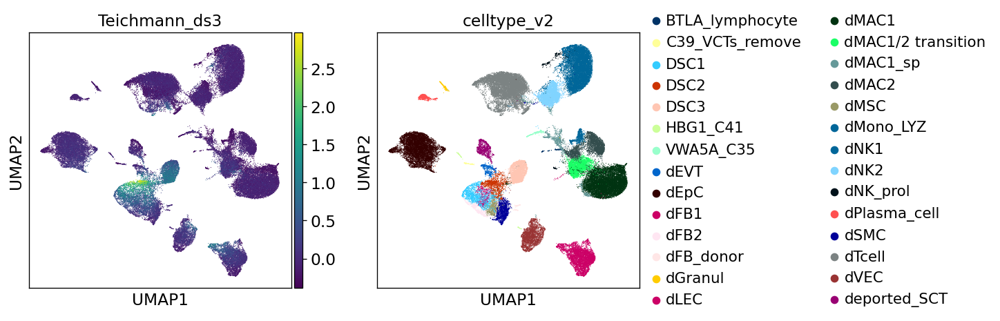

In [45]:
#Teichmann's scRNAseq data:

#Compute a module score using DSC3 subset of Teichmann (maps mainly to our DSC2 & somewhat dFB1): 
dS3_genes= ['RBP1', 'DCN', 'IGFBP1', 'LGALS1', 'LGALS3', 'S100A6', 'CRYAB', 'TIMP3', 'TXN', 'MYL9',
           'MGST1', 'TMEM45A', 'PDLIM1', 'DKK1', 'TIMP1', 'IGFBP4', 'IGFBP6', 'HSPB4', 'HSPB6', 'COX7A1',
           'SELM', 'PPDPF', 'APOD', 'CD59', 'NDUFA4', 'IFI27', 'NUPR1', 'RGCC', 'OST4', 'FKBP1A', 'COX6C']

sc.tl.score_genes(ldata_dec01, gene_list= dS3_genes, score_name= "Teichmann_ds3")
sc.pl.umap(ldata_dec01, color= ['Teichmann_ds3', 'celltype_v2'])

In [46]:
import csv

with open('./teichmann_clusters/Teichmann_clusters_0403.csv') as csvfile:
    rows = csv.reader(csvfile)
    res = list(zip(*rows))
    print(res)

[('NK_CD16', 'PRF1', 'B2M', 'PLAC8', 'HLA-B', 'CST7', 'HLA-C', 'KLRF1', 'FGFBP2', 'ITGB2', 'NKG7', 'KLRD1', 'KLRB1', 'HLA-E', 'CD247', 'HLA-A', 'CYBA', 'GZMA', 'FCGR3A', 'GZMB', 'GZMM', 'TXNIP', 'MALAT1', 'MYL12A', 'CCL5', 'MYO1F', 'SPON2', 'HCST', 'IFITM1', 'CTSW', 'CD7'), ('DSC3', 'RBP1', 'DCN', 'IGFBP1', 'LGALS1', 'S1A6', 'CRYAB', 'TIMP3', 'TXN', 'LGALS3', 'MYL9', 'MGST1', 'TMEM45A', 'PDLIM1', 'DKK1', 'TIMP1', 'IGFBP4', 'HSPB6', 'HSPB1', 'COX7A1', 'SELM', 'PPDPF', 'APOD', 'CD59', 'NDUFA4', 'COX6C', 'IFI27', 'NUPR1', 'OST4', 'RGCC', 'FKBP1A'), ('DSC1', 'CFD', 'SERPINF1', 'C1R', 'PTGDS', 'TAGLN', 'TPM2', 'RAMP1', 'SERPING1', 'C1S', 'PCOLCE', 'SPARCL1', 'ACTA2', 'APOD', 'IGFBP5', 'TCEAL4', 'HSPB1', 'PLA2G2A', 'RPL12', 'PLPP1', 'MYL9', 'OSR2', 'RARRES2', 'IGFBP6', 'SELM', 'CPXM1', 'HSPB6', 'IGFBP7', 'CYR61', 'IGF1', 'RPS18'), ('M3', 'CTSD', 'CD68', 'APOC1', 'GPX1', 'NPC2', 'TREM2', 'GPNMB', 'PSAP', 'CD9', 'CTSB', 'GRN', 'HLA-DRB1', 'CSTB', 'CAPG', 'FABP5', 'HLA-DRA', 'ATP6V1F', 'TSPO', 

In [47]:
NK1_CD16_pos= ['PRF1', 'B2M', 'PLAC8', 'HLA-B', 'CST7', 'HLA-C', 'KLRF1', 'FGFBP2', 'ITGB2', 'NKG7', 'KLRD1', 'KLRB1', 'HLA-E', 'CD247', 'HLA-A', 'CYBA', 'GZMA', 'FCGR3A', 'GZMB', 'GZMM', 'TXNIP', 'MYL12A', 'CCL5', 'MYO1F', 'SPON2', 'HCST', 'IFITM1', 'CTSW', 'CD7']
NK1_CD16_neg= ['SELL', 'PLAC8', 'KLRF1', 'KLRD1', 'GZMK', 'EEF1A1', 'CMC1', 'KLRB1', 'HOPX', 'CTSW', 'HLA-C', 'HLA-B', 'CD2', 'TXNIP', 'B2M', 'GNLY', 'IFITM1', 'ITGB2', 'CD7', 'IFITM2', 'NKG7', 'TRDC', 'FXYD5', 'RPL19', 'HLA-A', 'RPS27', 'DUSP2', 'LIMD2', 'RPS27A', 'HCST']

monocyte= ['CTSS', 'ITGB2', 'FCN1', 'PSAP', 'LYZ', 'SERPINA1', 'CFP', 'LCP1', 'GRN', 'NCF2', 'HCK', 'FGR', 'LAPTM5', 'C1orf54', 'MNDA', 'TKT', 'CYBB', 'FGL2', 'LILRA1', 'ALOX5', 'LILRB2', 'PECAM1', 'MPEG1', 'TNFRSF1B', 'CHP1', 'JAML', 'HK3', 'LILRB1', 'MYO1F', 'CLEC7A']

DSC3= ['RBP1', 'DCN', 'IGFBP1', 'LGALS1', 'S100A6', 'CRYAB', 'TIMP3', 'TXN', 'LGALS3', 'MYL9', 'MGST1', 'TMEM45A', 'PDLIM1', 'DKK1', 'TIMP1', 'IGFBP4', 'HSPB6', 'HSPB1', 'COX7A1', 'SELM', 'PPDPF', 'APOD', 'CD59', 'NDUFA4', 'COX6C', 'IFI27', 'NUPR1', 'OST4', 'RGCC', 'FKBP1A']
DSC1= ['CFD', 'SERPINF1', 'C1R', 'PTGDS', 'TAGLN', 'TPM2', 'RAMP1', 'SERPING1', 'C1S', 'PCOLCE', 'SPARCL1', 'ACTA2', 'APOD', 'IGFBP5', 'TCEAL4', 'HSPB1', 'PLA2G2A', 'RPL12', 'PLPP1', 'MYL9', 'OSR2', 'RARRES2', 'IGFBP6', 'SELM', 'CPXM1', 'HSPB6', 'IGFBP7', 'CYR61', 'IGF1', 'RPS18']

M3= ['CTSD', 'CD68', 'APOC1', 'GPX1', 'NPC2', 'TREM2', 'GPNMB', 'PSAP', 'CD9', 'CTSB', 'GRN', 'HLA-DRB1', 'CSTB', 'CAPG', 'FABP5', 'HLA-DRA', 'ATP6V1F', 'TSPO', 'CD74', 'HLA-DPB1', 'HLA-DPA1', 'FTH1', 'ACP5', 'HLA-DMA', 'HLA-DQB1', 'CYBA', 'LAPTM5', 'LYZ', 'ATP6VB', 'APOE']
M0= ['CTSS', 'S100A9', 'LYZ', 'FCN1', 'LST1', 'S100A8', 'S100A4', 'CSTA', 'MNDA', 'AIF1', 'CYBA', 'SERPINA1', 'TSPO', 'AP1S2', 'OAZ1', 'TYROBP', 'S100A12', 'TYMP', 'H3F3A', 'CFP', 'FGL2', 'HLA-DRA', 'TKT', 'PFDN5', 'SPI1', 'HLA-DRB1', 'S100A6', 'EVI2B', 'GMFG', 'CYBB']

dNK_prol= [ 'STMN1', 'H2AFZ', 'HMGB2', 'COTL1', 'TUBA1B', 'HMGN2', 'ACTB', 'GNLY', 'CORO1A', 'CTSW', 'TRDC', 'HMGB1', 'CLIC1', 'KIAA11', 'GZMA', 'KLRC1', 'PFN1', 'RAC2', 'GZMB', 'TUBB', 'NUCB2', 'GSTP1', 'UBE2C', 'XCL2', 'TYMS', 'CFL1', 'PTMA', 'SMC4', 'NKG7', 'MKI67']
Plasma= ['CD74', 'JCHAIN', 'IGKC', 'HLA-DRA', 'HLA-DRB1', 'HLA-DPB1', 'HLA-DPA1', 'PLAC8', 'CYBA', 'IRF7', 'HLA-DQA1', 'IRF8', 'MZB1', 'ITM2C', 'TCF4', 'PLD4', 'HLA-DRB5', 'HLA-DQB1', 'SPIB', 'LTB', 'BCL11A', 'CD37', 'LILRA4', 'ALOX5AP', 'HLA-DMA', 'CCDC5', 'RNASE6', 'DERL3', 'UCP2', 'SEC61B']

Granulocyte= ['GATA2', 'ANKRD28', 'HPGDS', 'CPA3', 'LYL1', 'RP11-62J15.3', 'RP11-354E11.2', 'SERPINB1', 'PRSS57', 'TPSAB1', 'H3F3A', 'BTK', 'CD82', 'TPSB2', 'NFE2', 'FCER1A', 'CYTL1', 'PTMA', 'C1orf228', 'RPL37A', 'TESPA1', 'C1orf186', 'CNRIP1', 'STMN1', 'MYB', 'GNA15', 'SPN', 'ZFAS1', 'ZEB2', 'HPGD']
ILC3= ['KLRB1', 'CD69', 'LTB', 'NFKBIA', 'CXCR4', 'CD52', 'LST1', 'IL7R', 'TRBC1', 'PRMT9', 'TNFAIP3', 'ZFP36', 'BTG1', 'RGS1', 'FXYD5', 'TMIGD2', 'IL4I1', 'TRDC', 'ID2', 'TSC22D3', 'XCL1', 'DUSP1', 'TNFRSF25', 'SPRY1', 'TRAC', 'BST2', 'SRGN', 'IL2RG', 'RPLP1', 'FNBP1']
FB2= ['EGFL6', 'DLK1', 'AGTR1', 'COL6A1', 'FRZB', 'SPARC', 'COL6A3', 'COL6A2', 'COL3A1', 'WNT2', 'GPC3', 'CALD1', 'PPP1R14A', 'COX4I2', 'COL1A2', 'GATM', 'MEG3', 'PLA2G2A', 'HGF', 'PLAC9', 'BGN', 'NID2', 'COL1A1', 'COL4A1', 'SERPINH1', 'NDUFA4L2', 'CHN1', 'MEST', 'LAMA2', 'COL4A2']

PV1= ['RGS5', 'COL18A1', 'IFITM3', 'CALD1', 'IGFBP7', 'MGP', 'SPARC', 'NDUFA4L2', 'CAV1', 'MYL9', 'CNN3', 'COL4A1', 'PPP1R14A', 'COL4A2', 'EPS8', 'COL1A2', 'COL3A1', 'MFGE8', 'COL1A1', 'HES4', 'NOTCH3', 'BGN', 'LAPTM4A', 'C11orf96', 'PTP4A3', 'ITGB1', 'ADIRF', 'IFITM1', 'TPM2', 'TPPP3']
PV2= ['MGP', 'IFITM3', 'MYL9', 'SELM', 'IGFBP7', 'SPARC', 'CAV1', 'COL3A1', 'TPM4', 'CALD1', 'LAPTM4A', 'C11orf96', 'APOE', 'C1R', 'COL18A1', 'C1S', 'IGFBP4', 'COL6A3', 'COL1A2', 'AEBP1', 'COL1A1', 'MFGE8', 'VIM', 'NUPR1', 'FTH1', 'HSPB1', 'CD63', 'EGR1', 'TUBA1A', 'SERPING1']

In [48]:
DC1= ['HLA-DPB1', 'CD74', 'HLA-DPA1', 'HLA-DRB1', 'HLA-DQB1', 'HLA-DRA', 'HLA-DQA1', 'CST3', 
      'HLA-DRB5', 'C1orf54', 'IRF8', 'CPVL', 'SNX3', 'HLA-DMA', 'DNASE1L3', 'LYZ', 'LSP1', 'CLEC9A', 
      'FGL2', 'LGALS2', 'ACTB', 'RGS1', 'C1orf162', 'HLA-DQA2', 'PPT1', 'SPI1', 'WDFY4', 'S100A1', 'HLA-DMB', 'AIF1']

DC2= ['FCER1A', 'HLA-DPB1', 'HLA-DQA1', 'HLA-DQA2', 'HLA-DRA', 'HLA-DPA1', 'HLA-DQB1', 'HLA-DRB1', 
            'JAML', 'LYZ', 'CFP', 'HLA-DRB5', 'HLA-DMA', 'LST1', 'CD74', 'MNDA', 'HLA-DMB', 'CD1C', 'AP1S2', 
            'C1orf162', 'SPI1', 'CLEC1A', 'LY86', 'CST3', 'SAMHD1', 'CPVL', 'LSP1', 'CTSS', 'CD33', 'RNASE6']

In [49]:
ldata_norm_int= ldata_dec01.raw.to_adata()

#Normalize the data:
sc.pp.normalize_total(ldata_norm_int, target_sum= 1e4)
sc.pp.log1p(ldata_norm_int)

In [50]:
sc.tl.score_genes(ldata_norm_int, gene_list= NK1_CD16_pos, score_name= "NK1_CD16_pos")
sc.tl.score_genes(ldata_norm_int, gene_list= NK1_CD16_neg, score_name= "NK1_CD16_neg")
sc.tl.score_genes(ldata_norm_int, gene_list= DC1, score_name= "DC1")
sc.tl.score_genes(ldata_norm_int, gene_list= DC2, score_name= "DC2")
sc.tl.score_genes(ldata_norm_int, gene_list= dNK_prol, score_name= "dNK_prol")
sc.tl.score_genes(ldata_norm_int, gene_list= PV1, score_name= "Perivascular1")
sc.tl.score_genes(ldata_norm_int, gene_list= PV2, score_name= "Perivascular2")
sc.tl.score_genes(ldata_norm_int, gene_list= FB2, score_name= "Teichmann_FB2")
sc.tl.score_genes(ldata_norm_int, gene_list= monocyte, score_name= "Teichmann_monocyte")
sc.tl.score_genes(ldata_norm_int, gene_list= M3, score_name= "Teichmann_M3")
sc.tl.score_genes(ldata_norm_int, gene_list= M0, score_name= "Teichmann_M0")

sc.tl.score_genes(ldata_norm_int, gene_list= DSC3, score_name= "Teichmann_ds3")
sc.tl.score_genes(ldata_norm_int, gene_list= DSC1, score_name= "Teichmann_ds1")
sc.tl.score_genes(ldata_norm_int, gene_list= ILC3, score_name= "Teichmann_ILC3")
sc.tl.score_genes(ldata_norm_int, gene_list= Granulocyte, score_name= "Teichmann_Granulocyte")
sc.tl.score_genes(ldata_norm_int, gene_list= Plasma, score_name= "Teichmann_Plasma")

In [53]:
#sc.pl.umap(ldata_norm_int, color= ['NK1_CD16_pos', 'NK1_CD16_neg', 'dNK_prol', 'Teichmann_ILC3'])

#Our dNK cells weren't FACS sorted. 

In [54]:
#sc.pl.umap(ldata_norm_int, color= ['Teichmann_ds3', 'Teichmann_ds1', 'Perivascular1', 'Perivascular2'])

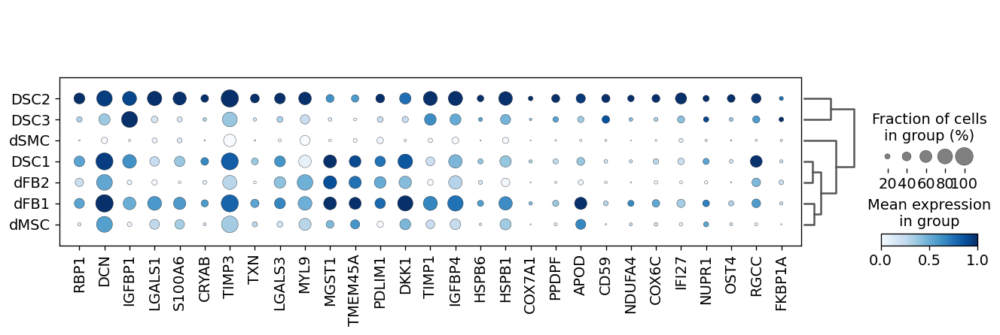

In [55]:
DSC3= ['RBP1', 'DCN', 'IGFBP1', 'LGALS1', 'S100A6', 'CRYAB', 'TIMP3', 'TXN', 'LGALS3', 'MYL9', 
       'MGST1', 'TMEM45A', 'PDLIM1', 'DKK1', 'TIMP1', 'IGFBP4', 'HSPB6', 'HSPB1', 'COX7A1', 
       'PPDPF', 'APOD', 'CD59', 'NDUFA4', 'COX6C', 'IFI27', 'NUPR1', 'OST4', 'RGCC', 'FKBP1A']


sc.pl.dotplot(ldata_stromal, DSC3, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var")

In [65]:
# #sc.tl.dendrogram(ldata_stromal, groupby= 'celltype_v2') 
# DSC1= ['CFD', 'SERPINF1', 'C1R', 'PTGDS', 'TAGLN', 'TPM2', 'RAMP1', 'SERPING1', 'C1S', 'PCOLCE', 
#        'SPARCL1', 'ACTA2', 'APOD', 'IGFBP5', 'TCEAL4', 'HSPB1', 'PLA2G2A', 'RPL12', 'PLPP1', 'MYL9', 
#        'OSR2', 'RARRES2', 'IGFBP6', 'CPXM1', 'HSPB6', 'IGFBP7', 'IGF1', 'RPS18']
      
# sc.pl.dotplot(ldata_stromal, DSC1, groupby= 'celltype_v2', dendrogram=True,
#     color_map="Blues", use_raw=True, standard_scale="var")

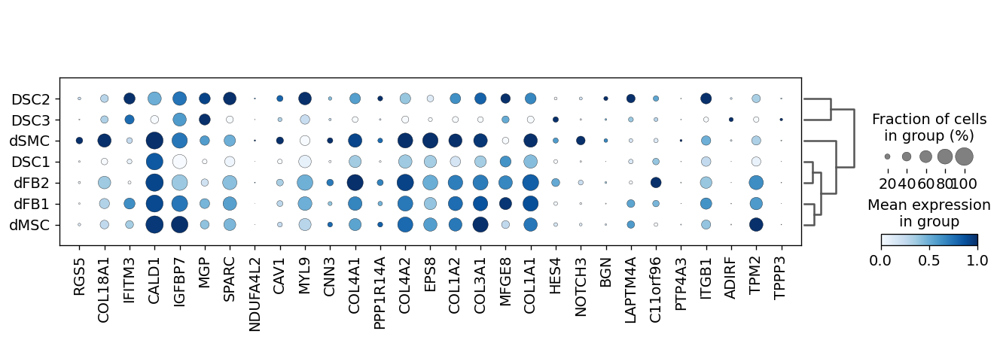

In [58]:
#Extract PV (perivascular cell markers) from: https://www.nature.com/articles/s41586-018-0698-6 
PV1= ['RGS5', 'COL18A1', 'IFITM3', 'CALD1', 'IGFBP7', 'MGP', 'SPARC', 'NDUFA4L2', 'CAV1', 'MYL9', 
      'CNN3', 'COL4A1', 'PPP1R14A', 'COL4A2', 'EPS8', 'COL1A2', 'COL3A1', 'MFGE8', 'COL1A1', 'HES4', 
      'NOTCH3', 'BGN', 'LAPTM4A', 'C11orf96', 'PTP4A3', 'ITGB1', 'ADIRF', 'TPM2', 'TPPP3']
      
PV2= ['MGP', 'IFITM3', 'MYL9', 'IGFBP7', 'SPARC', 'CAV1', 'COL3A1', 'TPM4', 'CALD1', 'LAPTM4A', 
      'C11orf96', 'APOE', 'C1R', 'COL18A1', 'C1S', 'IGFBP4', 'COL6A3', 'COL1A2', 'AEBP1', 'COL1A1', 'MFGE8', 
      'VIM', 'NUPR1', 'FTH1', 'HSPB1', 'CD63', 'EGR1', 'TUBA1A', 'SERPING1']

sc.pl.dotplot(ldata_stromal, PV1, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var")

#sc.pl.dotplot(ldata_stromal, ["Perivascular1", "Perivascular2"], groupby= 'celltype_v2', dendrogram=True,
    #color_map="Blues", use_raw=True, standard_scale="var")

#PV1 (RGS5 group) is relatively enriched in dSMC. RGS5 is a well-known marker of dSMC. 

In [64]:
# #Plot on early only where stromal clusters are prominent:
# sc.pl.dotplot(ldata_stromal[ldata_stromal.obs['time']== 'early'], 
#               PV1, groupby= 'celltype_v2', dendrogram=True,
#     color_map="Blues", use_raw=True, standard_scale="var")

# #PV2 markers: 
# sc.pl.dotplot(ldata_stromal[ldata_stromal.obs['time']== 'early'], 
#               PV2, groupby= 'celltype_v2', dendrogram=True,
#     color_map="Blues", use_raw=True, standard_scale="var")

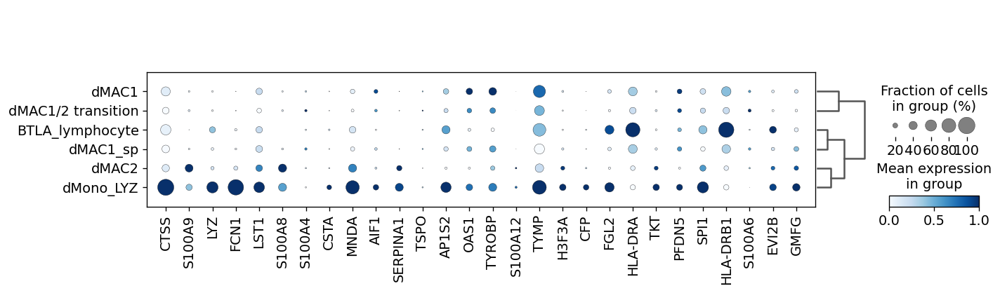

In [60]:
#Plot M0 gene-set: 
M0= ['CTSS', 'S100A9', 'LYZ', 'FCN1', 'LST1', 'S100A8', 'S100A4', 'CSTA', 'MNDA', 'AIF1',  
     'SERPINA1', 'TSPO', 'AP1S2', 'OAS1', 'TYROBP', 'S100A12', 'TYMP', 'H3F3A', 'CFP', 'FGL2', 'HLA-DRA', 
     'TKT', 'PFDN5', 'SPI1', 'HLA-DRB1', 'S100A6', 'EVI2B', 'GMFG']

sc.pl.dotplot(ldata_mac, M0, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var")

#dMono_LYZ was later renamed to "dMono1" in the manuscript. 

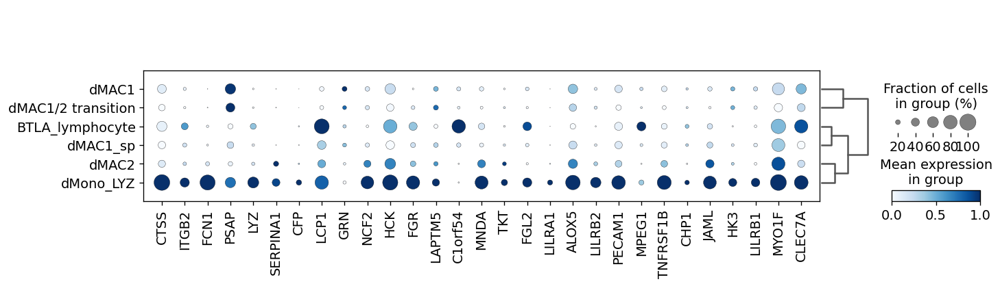

In [61]:
#Teichmann's monocyte signatures maps robustly to dMono_LYZ (later renamed as dMono1): 
monocyte= ['CTSS', 'ITGB2', 'FCN1', 'PSAP', 'LYZ', 'SERPINA1', 'CFP', 'LCP1', 'GRN', 'NCF2', 
           'HCK', 'FGR', 'LAPTM5', 'C1orf54', 'MNDA', 'TKT', 'FGL2', 'LILRA1', 'ALOX5', 
           'LILRB2', 'PECAM1', 'MPEG1', 'TNFRSF1B', 'CHP1', 'JAML', 'HK3', 'LILRB1', 'MYO1F', 'CLEC7A']


#MAC subpopulations:
sc.pl.dotplot(ldata_mac, monocyte, groupby= 'celltype_v2', dendrogram=True,
    color_map="Blues", use_raw=True, standard_scale="var")

In [63]:
# M3= ['CD68', 'APOC1', 'NPC2', 'TREM2', 'GPNMB', 'PSAP', 'CD9', 'CTSB', 'GRN', 
#      'HLA-DRB1', 'CSTB', 'CAPG', 'FABP5', 'HLA-DRA', 'TSPO', 'CD74', 'HLA-DPB1', 'HLA-DPA1', 
#      'FTH1', 'ACP5', 'HLA-DMA', 'HLA-DQB1', 'CYBA', 'LAPTM5', 'LYZ', 'APOE']


# #MAC:: M3 subpopulations:
# sc.pl.dotplot(ldata_mac, M3, groupby= 'celltype_v2', dendrogram=True,
#     color_map="Blues", use_raw=True, standard_scale="var")